# Customer Segmentation - RFM - Clustering

<div style="text-align:center">
    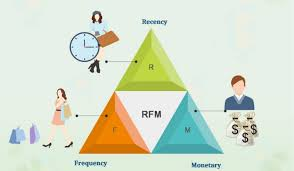
</div>

In [41]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from termcolor import colored

import warnings
warnings.filterwarnings("ignore")

pd.set_option("display.max_columns",100)
pd.set_option("display.width",600)
pd.set_option("display.max_rows",100)
pd.set_option('display.float_format', lambda x: '%.3f' % x) 


from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

from yellowbrick.cluster import KElbowVisualizer


In [2]:
df = pd.read_csv("PBL5recommendationdata.csv", encoding="latin-1")
df.head()

,Customers.id,Customers.fname,Customers.lname,Customers.company,Customers.create_date,Customers.status,Customers.mailing,Customers.reminders,Customers.tax_exempt,Customers.account_id,Customers.sales_rep,Customers.rewards,Customers.profile_id,Customers.last_modified,Customers.customer_type,Orders.id,Orders.customer_id,Orders.fname,Orders.lname,Orders.company,Orders.order_number,Orders.reorder_id,Orders.external_source,Orders.external_id,Orders.currency,Orders.sales_rep,Orders.subtotal,Orders.tax,Orders.shipping,Orders.coupon_id,Orders.coupon_amount,Orders.gift_id,Orders.gift_amount,Orders.fee_name,Orders.fee_amount,Orders.discount_name,Orders.discount_amount,Orders.total,Orders.balance_due,Orders.shipping_carrier,Orders.shipping_method,Orders.shipping_trans,Orders.shipping_flags,Orders.weight,Orders.tracking,Orders.payment_status,Orders.payment_date,Orders.payment_user,Orders.payment_type,Orders.payment_method,Orders.payment_amount,Orders.purchase_order,Orders.payment_id,Orders.payment_code,Orders.payment_ref,Orders.status,Orders.placed_date,Orders.updated_date,Orders.shipped_date,Orders.comments,Orders.notes,Orders.registry_id,Orders.gift_message,Orders.website,Orders.mailing,Orders.flags,Orders.partial_ship,Orders.customer_type,Order_Items.id,Order_Items.parent,Order_Items.product_id,Order_Items.product_name,Order_Items.attributes,Order_Items.attribute_names,Order_Items.attribute_prices,Order_Items.qty,Order_Items.price,Order_Items.cost,Order_Items.registry_item,Order_Items.related_id,Order_Items.reorder_frequency,Order_Items.account_id,Order_Items.flags,Products.id,Products.status,Products.product_type,Products.template,Products.vendor,Products.import_id,Products.name,Products.display_name,Products.menu_name,Products.list_price,Products.price,Products.sale_price,Products.cost,Products.flags,Products.left_flag,Products.right_flag,Products.last_modified,Products.taxable,Products.shopping_gtin,Products.shopping_brand,Products.shopping_mpn,Products.shopping_gender,Products.shopping_color,Products.shopping_age,Products.shopping_flags,Products.amazon_asin,Products.amazon_type,Products.amazon_item_type,Products.amazon_price,Products.google_shopping_id,Products.google_shopping_type,Products.google_shopping_cat,Products.google_adwords,Products.shopping_cat,Products.shopping_type,Products.pricegrabber_cat,Products.shopzilla_cat,Products.thefind_cat,Products.quickbooks_id,Products.qb_edit_sequence,Products.price_break_type,Products.price_breaks,Products.short_description,Products.long_description,Products.websites,Products.video,Products.audio,Products.seo_title,Products.seo_description,Products.seo_keywords,Products.seo_header,Products.seo_footer,Products.seo_url,Products.seo_category,Products.unit,Products.packaging,Products.display_packaging,Products.multiple,Products.length,Products.width,Products.height,Products.rx,Products.latex,Products.upc,Products.msds_link,Products.msds_label,Products.lit_link,Products.lit_label,Products.hcpcs,Products.case_qty,Products.markup,Products.override_markup,Products.notes,Products.import_flags,Products.map_price,Products.features_title,Products.warranty,Products.hygienic,Products.default_quantity,Products.user_size,Products.assembly,Products.installation,Products.shipping_length,Products.shipping_width,Products.shipping_height,Products.shipping_weight,Products.handling_time,Products.rotation_link,Products.google_shopping_label,Products.product_option,Products.size,Products.material,Products.arm_style,Products.leg_style,Products.seat_size,Products.family_id,Products.saved_status,Products.freight_cost
0,797,Christy,Dill,Company0,1426018724,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1437764306,0.000,3758,797,Christy,Dill,Company0,3758,NaN,NaN,NaN,USD,NaN,57.200,0.000,9.950,13.000,2.860,NaN,NaN,NaN,NaN,NaN,NaN,64.290,NaN,fedex,11|Ground,NaN,NaN,NaN,5.7204E+14,3.000,1426019099.000,NaN,authorize.net,NaN,64.290,NaN,6993607863,510142,NaN,1,1426019099,1438868410.000,1426100922.000,NaN,Insured By Eye4Fraud,NaN,NaN,NaN,

In [3]:
def check_df(df, head=5, tail=5):
    print(" SHAPE ".center(70, '*'))
    print(f'Observations -------> {df.shape[0]}')
    print(f'Features     -------> {df.shape[1]}')
    print(f"Shape of dataset: {colored(df.shape, 'red')}")
    print(" TYPES OF FEATURES ".center(70, '*'))
    print(df.dtypes,"\n")
    print(" INFO ".center(70, "*"))
    print("\n",df.info(),"\n")
    print(' DUPLICATE VALUE ANALYSIS '.center(70, '*'))
    print("\n",df.duplicated().sum(),"\n")
    print(" MISSING VALUES ".center(70, "*"))
    print(df.isnull().sum())
    print(" DESCRIPTIVE STATISTICS ".center(70, "*"))
    print(df.describe().T)
check_df(df)

******************************* SHAPE ********************************
Observations -------> 4194
Features     -------> 181
Shape of dataset: (4194, 181)
************************* TYPES OF FEATURES **************************
Customers.id                        int64
Customers.fname                    object
Customers.lname                    object
Customers.company                  object
Customers.create_date               int64
Customers.status                  float64
Customers.mailing                 float64
Customers.reminders               float64
Customers.tax_exempt              float64
Customers.account_id              float64
Customers.sales_rep               float64
Customers.rewards                 float64
Customers.profile_id              float64
Customers.last_modified             int64
Customers.customer_type           float64
Orders.id                           int64
Orders.customer_id                  int64
Orders.fname                       object
Orders.lname       

In [4]:
df.describe(include="object").T

,count,unique,top,freq
Customers.fname,4194,1631,John,46
Customers.lname,4194,2557,Ceccotti,41
Customers.company,727,425,Company145,27
Orders.fname,4194,1636,John,46
Orders.lname,4194,2559,Ceccotti,41
Orders.company,728,427,Company145,27
Orders.order_number,4194,3565,16186,10
Orders.external_source,365,3,Ebay,363
Orders.currency,4194,1,USD,4194
Orders.fee_name,227,19,Fee,127


In [5]:
null_num = df.isnull().sum()
droppped_columns = null_num[null_num > 2000].index
df = df.drop(columns=droppped_columns)

In [6]:
df.shape

(4194, 83)

In [7]:

customers = df[["Customers.id","Customers.create_date","Customers.last_modified","Customers.customer_type"]]


In [8]:
product_col = [col for col in df.columns if col.startswith("Product")]
product = df[product_col]
product.head()

,Products.id,Products.status,Products.template,Products.vendor,Products.import_id,Products.name,Products.display_name,Products.list_price,Products.price,Products.cost,Products.flags,Products.last_modified,Products.taxable,Products.shopping_gtin,Products.shopping_brand,Products.shopping_mpn,Products.shopping_flags,Products.amazon_asin,Products.amazon_item_type,Products.google_shopping_id,Products.google_shopping_type,Products.google_shopping_cat,Products.shopping_cat,Products.shopping_type,Products.pricegrabber_cat,Products.shopzilla_cat,Products.thefind_cat,Products.quickbooks_id,Products.qb_edit_sequence,Products.short_description,Products.long_description,Products.seo_title,Products.seo_url,Products.seo_category,Products.unit,Products.packaging,Products.multiple,Products.hcpcs,Products.case_qty,Products.override_markup,Products.import_flags,Products.shipping_length,Products.shipping_width,Products.shipping_height,Products.family_id,Products.saved_status
0,2310.000,0.000,sub-product-detail.html,1.000,3.000,"Basic Steel Rollators,Green","Basic Lightweight Rollators For Adults, With S...",80.700,57.640,44.000,0.000,1463162723.000,1.000,10884400000000.000,MEDLINE,MDS86850EGS,62.000,B00I6GQE0A,health-care-products,generic/online%3Aen%3AUS%3A2310,"Walking Aids > Rollators, & Walkers > Rollators",Health & Beauty > Health Care,NaN,NaN,NaN,NaN,NaN,8000064C-1434298761,1450324676.000,"ROLLATOR,BASIC,STEEL,6"",GREEN","<ul><li> Classically designed, value priced</...","Basic Lightweight Rollators For Adults, With S...",Basic-Rollators-For-Adults-With-Seat-Green-6-W...,0.000,EA,1 Each / Each,1 EA,E0149 +E0156,1.000,0.000,136.000,24.800,7.500,30.400,PF61071,0.000
1,177.000,1.000,sub-product-detail.html,1.000,3.000,Urinary Drain Bags,Urinary Drain Bags,14.410,10.290,1.870,65.000,1462369955.000,1.000,10080200000000.000,MEDLINE,DYNC1674H,62.000,B000QF7Y76,health-care-products,NaN,"Incontinence, Urology & Ostomy > Urology > Dra...",Health & Beauty > Health Care,199.000,Miscellaneous,Health & Beauty > Medical Supplies > Medical Aids,22005.000,Health & Beauty > Medical Supplies > Medical Aids,80008C35-1438901283,1450321651.000,"BAG,DRAINAGE,UROLOGY,2000ML,ANTI REFLUX",<ul><li> Only Medline drain bags have a slide...,Urinary Drain Bags | MEDLINE - DYNC1674H,Urinary-Drain-Bags0000,0.000,EA,1 Each / Each,1 EA,A4357,1.000,0.000,0.000,8.000,7.000,1.500,PF02132,NaN
2,1.000,0.000,sub-product-detail.html,1.000,3.000,"SensiCare Nitrile Exam Gloves,Blue,XX-Large","SensiCare Nitrile Exam Gloves, Blue, XX-Large",96.290,68.780,52.500,32896.000,1463162723.000,1.000,40080200000000.000,MEDLINE,484805,62.000,B002209AOI,health-care-products,generic/online%3Aen%3AUS%3A1,Apparel > Gloves > Nonsterile PF LF Synthetic ...,Health & Beauty > Health Care,199.000,Miscellaneous,Health & Beauty > Medical Supplies > Medical Aids,22005.000,Health & Beauty > Medical Supplies > Medical Aids,800087BB-1438898332,1450321427.000,"GLOVE,EXAM,NITRILE,BLUE,FINGRTIP,TXT,XXL",<ul><li> SensiCare&reg; nitrile exam gloves fe...,"Nitrile Exam Gloves, Blue, XX-Large | MEDLINE ...",SensiCare-Nitrile-Exam-GlovesBlueXX-Large,0.000,CS,800 Each / Case,1 CS,NO GOVERNMENT OR SUPPLIER HCPCS CODE VERIFICATION,800.000,0.000,NaN,13.230,10.040,10.240,PF00342,0.000
3,983.000,0.000,sub-product-detail.html,1.000,3.000,Basket for 2-Button Walkers,Basket for 2-Button Walkers,27.380,19.560,12.620,0.000,1462595475.000,1.000,NaN,MEDLINE,MDS86615KH,62.000,B00083DG00,health-care-products,NaN,"Walking Aids > Rollators, & Walkers > Walkers ...",Health & Beauty > Health Care,199.000,Miscellaneous,Health & Beauty > Medical Supplies > Medical Aids,22005.000,Health & Beauty > Medical Supplies > Medical Aids,8000065E-1434298780,1450322786.000,"BASKET,WALKER,FOR 2 BUTTON WALK",<ul><li> This wire basket attaches to almost a...,Basket for 2-Button Walkers | MEDLINE - MDS866...,Basket-for-2-Button-Walkers-2,0.000,EA,1 Each / Each,1 EA,A9270,1.000,0.000,NaN,10.600,7.800,18.500,PF04970,NaN
4,991.000,1.000,sub-product-detail.

In [9]:
products=product[["Products.id","Products.list_price","Products.price","Products.cost","Products.status"]]

In [10]:
orders = df[["Orders.id","Orders.status","Orders.subtotal","Orders.total","Orders.payment_status","Orders.payment_amount","Orders.payment_date"]]


## Handling Missing Values

In [11]:
customers.isnull().sum()

Customers.id                 0
Customers.create_date        0
Customers.last_modified      0
Customers.customer_type    423
dtype: int64

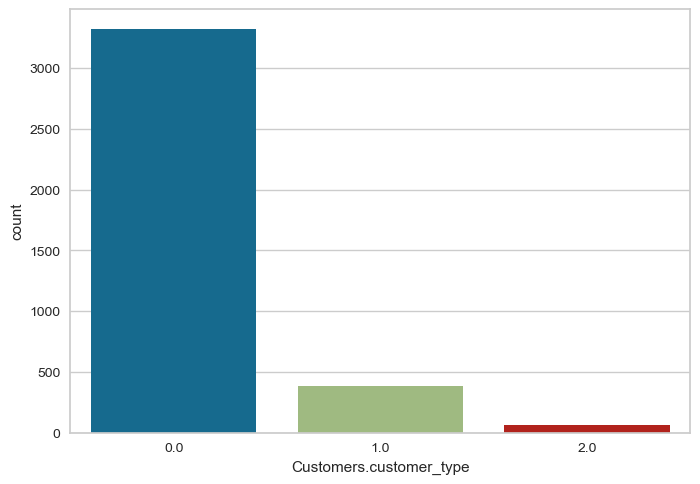

In [12]:
sns.countplot(x = customers["Customers.customer_type"]);

In [13]:
customers.fillna(0,inplace=True)

In [14]:
products[products.isnull()==True]

,Products.id,Products.list_price,Products.price,Products.cost,Products.status
0,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,NaN,NaN
7,NaN,NaN,NaN,NaN,NaN
8,NaN,NaN,NaN,NaN,NaN
9,NaN,NaN,NaN,NaN,NaN


In [15]:
products = products.dropna(axis=0)

In [16]:
orders.isnull().sum()

Orders.id                 0
Orders.status             0
Orders.subtotal           0
Orders.total              0
Orders.payment_status     5
Orders.payment_amount    18
Orders.payment_date      18
dtype: int64

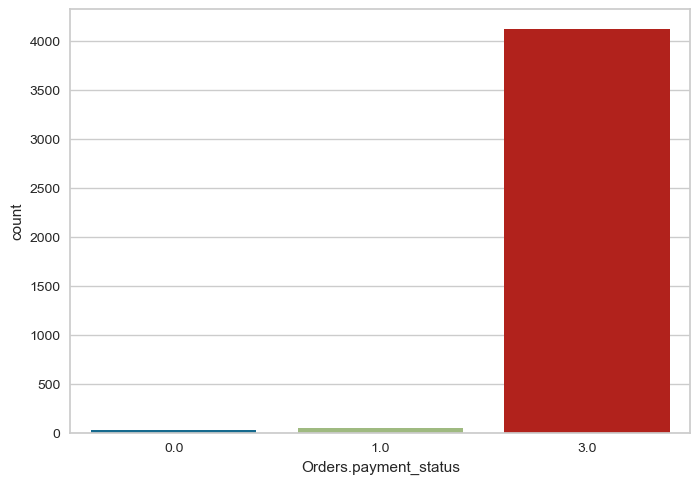

In [17]:
sns.countplot(x=orders["Orders.payment_status"]);

In [18]:
orders["Orders.payment_status"].fillna(3, inplace=True)

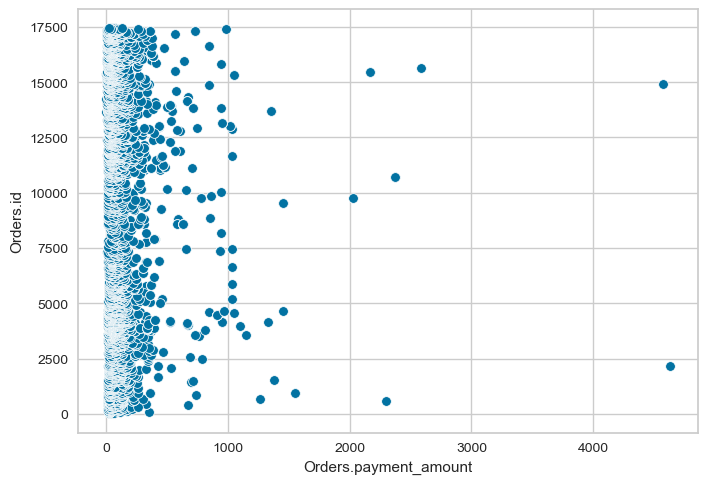

In [19]:
sns.scatterplot(orders, x="Orders.payment_amount", y="Orders.id");

In [20]:
orders["Orders.payment_amount"].fillna(orders["Orders.payment_amount"].median(), inplace=True)

In [21]:
orders["Orders.payment_date"].fillna(orders["Orders.payment_date"].mode()[0], inplace=True)

## insert dataframe to sql

In [22]:
import sqlite3

In [23]:
df_c = pd.DataFrame(customers)
conn = sqlite3.connect("customers.db")
df_c.to_sql("customers", conn, index=False, if_exists = "replace")
conn.close()

In [24]:
df_p = pd.DataFrame(products)
conn = sqlite3.connect("products.db")
df_p.to_sql("products",conn, index=False, if_exists = "replace")
conn.close()

In [25]:
df_o = pd.DataFrame(orders)
conn = sqlite3.connect("orders.db")
df_o.to_sql("orders",conn, index=False, if_exists = "replace")
conn.close()

## Import the tables from the database and merge them into a single data frame

In [26]:
conn_customers = sqlite3.connect("customers.db")
df_customers = pd.read_sql_query("SELECT * FROM customers", conn_customers)
conn_customers.close()

In [27]:
df_customers

,Customers.id,Customers.create_date,Customers.last_modified,Customers.customer_type
0,797,1426018724,1437764306,0.000
1,3,1386089139,1437764354,0.000
2,3,1386089139,1437764354,0.000
3,4,1386780263,1437762646,0.000
4,5,1386861599,1437764316,0.000
5,5,1386861599,1437764316,0.000
6,5,1386861599,1437764316,0.000
7,7,1388155947,1437763617,0.000
8,8,1389303216,1437763421,0.000
9,10,1390509516,1437763553,0.000


In [28]:
conn_products = sqlite3.connect("products.db")
df_products = pd.read_sql_query("SELECT * FROM products", conn_products)
conn_products.close()

In [29]:
df_products

,Products.id,Products.list_price,Products.price,Products.cost,Products.status
0,2310.000,80.700,57.640,44.000,0.000
1,177.000,14.410,10.290,1.870,1.000
2,1.000,96.290,68.780,52.500,0.000
3,983.000,27.380,19.560,12.620,0.000
4,991.000,50.470,36.050,25.750,1.000
5,1379.000,54.870,39.190,27.990,0.000
6,815.000,84.290,60.210,45.960,0.000
7,795.000,21.710,15.510,2.820,3.000
8,1430.000,60.280,43.060,31.200,0.000
9,1385.000,52.930,37.810,27.010,0.000


In [30]:
conn_orders = sqlite3.connect("orders.db")
df_orders = pd.read_sql_query("SELECT * FROM orders", conn_orders)
conn_orders.close()

In [31]:
df_orders

,Orders.id,Orders.status,Orders.subtotal,Orders.total,Orders.payment_status,Orders.payment_amount,Orders.payment_date
0,3758,1,57.200,64.290,3.000,64.290,1426019099.000
1,23,1,20.000,29.990,3.000,29.990,1386090455.000
2,9531,3,68.780,78.730,3.000,78.730,1449603652.000
3,29,1,19.560,29.550,3.000,29.550,1386780263.000
4,30,1,36.050,46.000,3.000,46.000,1386861599.000
5,226,1,44.460,54.410,0.000,79.990,1461860089.000
6,1658,1,14.630,24.580,3.000,24.580,1410363655.000
7,32,1,39.190,49.140,3.000,49.140,1388155947.000
8,40,1,59.750,69.700,3.000,69.700,1389647443.000
9,70,1,34.000,34.000,3.000,34.000,1390509774.000


In [32]:
df_merge = pd.concat([df_customers, df_products, df_orders], axis=1)
df_merge

,Customers.id,Customers.create_date,Customers.last_modified,Customers.customer_type,Products.id,Products.list_price,Products.price,Products.cost,Products.status,Orders.id,Orders.status,Orders.subtotal,Orders.total,Orders.payment_status,Orders.payment_amount,Orders.payment_date
0,797,1426018724,1437764306,0.000,2310.000,80.700,57.640,44.000,0.000,3758,1,57.200,64.290,3.000,64.290,1426019099.000
1,3,1386089139,1437764354,0.000,177.000,14.410,10.290,1.870,1.000,23,1,20.000,29.990,3.000,29.990,1386090455.000
2,3,1386089139,1437764354,0.000,1.000,96.290,68.780,52.500,0.000,9531,3,68.780,78.730,3.000,78.730,1449603652.000
3,4,1386780263,1437762646,0.000,983.000,27.380,19.560,12.620,0.000,29,1,19.560,29.550,3.000,29.550,1386780263.000
4,5,1386861599,1437764316,0.000,991.000,50.470,36.050,25.750,1.000,30,1,36.050,46.000,3.000,46.000,1386861599.000
5,5,1386861599,1437764316,0.000,1379.000,54.870,39.190,27.990,0.000,226,1,44.460,54.410,0.000,79.990,1461860089.000
6,5,1386861599,1437764316,0.000,815.000,84.290,60.210,45.960,0.000,1658,1,14.630,24.580,3.000,24.580,1410363655.000
7,7,1388155947,1437763617,0.000,795.000,21.710,15.510,2.820,3.000,32,1,39.190,49.140,3.000,49.140,1388155947.000
8,8,1389303216,1437763421,0.000,1430.000,60.280,43.060,31.200,0.000,40,1,59.750,69.700,3.000,69.700,1389647443.000
9,10,1390509516,1437763553,0.000,1385.000,52.930,37.810,27.010,0.000,70,1,34.000,34.000,3.000,34.000,1390509774.000


In [33]:
df_merge.isnull().sum()

Customers.id                 0
Customers.create_date        0
Customers.last_modified      0
Customers.customer_type      0
Products.id                178
Products.list_price        178
Products.price             178
Products.cost              178
Products.status            178
Orders.id                    0
Orders.status                0
Orders.subtotal              0
Orders.total                 0
Orders.payment_status        0
Orders.payment_amount        0
Orders.payment_date          0
dtype: int64

In [34]:
df_merge.shape

(4194, 16)

In [35]:
df_merge.dropna(axis=0, inplace=True)

In [36]:
df_merge.isnull().sum()

Customers.id               0
Customers.create_date      0
Customers.last_modified    0
Customers.customer_type    0
Products.id                0
Products.list_price        0
Products.price             0
Products.cost              0
Products.status            0
Orders.id                  0
Orders.status              0
Orders.subtotal            0
Orders.total               0
Orders.payment_status      0
Orders.payment_amount      0
Orders.payment_date        0
dtype: int64

In [37]:
df_merge.shape

(4016, 16)

In [38]:
df_merge.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4016 entries, 0 to 4015
Data columns (total 16 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Customers.id             4016 non-null   int64  
 1   Customers.create_date    4016 non-null   int64  
 2   Customers.last_modified  4016 non-null   int64  
 3   Customers.customer_type  4016 non-null   float64
 4   Products.id              4016 non-null   float64
 5   Products.list_price      4016 non-null   float64
 6   Products.price           4016 non-null   float64
 7   Products.cost            4016 non-null   float64
 8   Products.status          4016 non-null   float64
 9   Orders.id                4016 non-null   int64  
 10  Orders.status            4016 non-null   int64  
 11  Orders.subtotal          4016 non-null   float64
 12  Orders.total             4016 non-null   float64
 13  Orders.payment_status    4016 non-null   float64
 14  Orders.payment_amount    4016

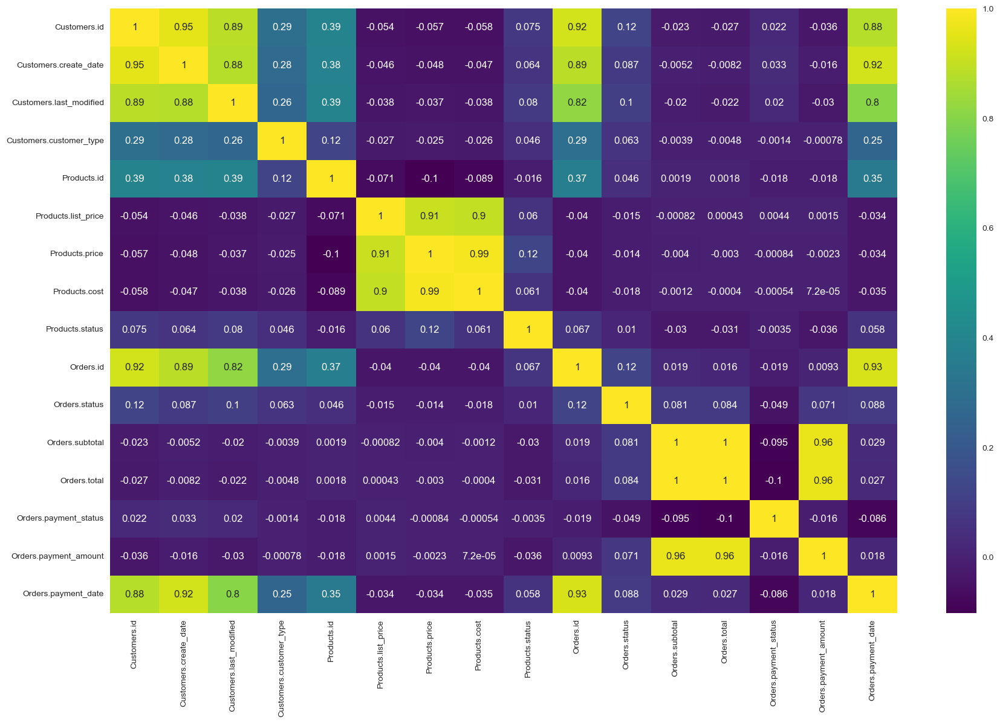

In [40]:
plt.figure(figsize=(21,13))
sns.heatmap(df_merge.corr(numeric_only=True), annot=True, cmap="viridis");

## Modelling

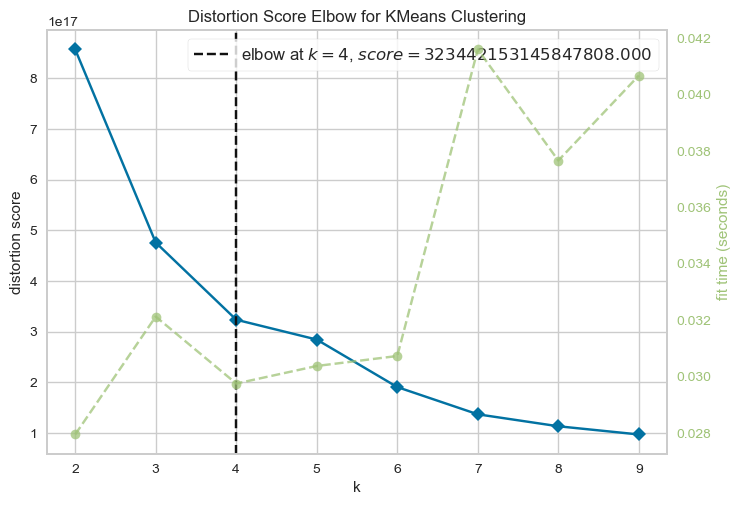

In [46]:
km = KMeans(random_state=42)
vis = KElbowVisualizer(km, k=(2,10))
vis.fit(df_merge)
vis.show();


In [47]:
model = KMeans(4)
model.fit(df_merge)

KMeans(n_clusters=4)

In [49]:
prediction = model.predict(df_merge)
prediction

array([2, 3, 0, ..., 1, 1, 1])

In [50]:
df_merge["cluster"] = prediction
df_merge.sample(3)

,Customers.id,Customers.create_date,Customers.last_modified,Customers.customer_type,Products.id,Products.list_price,Products.price,Products.cost,Products.status,Orders.id,Orders.status,Orders.subtotal,Orders.total,Orders.payment_status,Orders.payment_amount,Orders.payment_date,cluster
3250,2785,1457623221,1457623221,0.000,1673.000,45.680,32.630,22.500,0.000,13964,1,167.080,177.030,3.000,177.030,1457624486.000,1
303,289,1408549418,1437762734,0.000,1426.000,68.010,48.580,35.200,0.000,1418,1,56.360,61.370,3.000,61.360,1408549419.000,3
3074,2635,1456420593,1456955179,0.000,1373.000,60.660,43.330,31.400,0.000,13252,1,99.000,89.100,3.000,89.100,1456420594.000,1


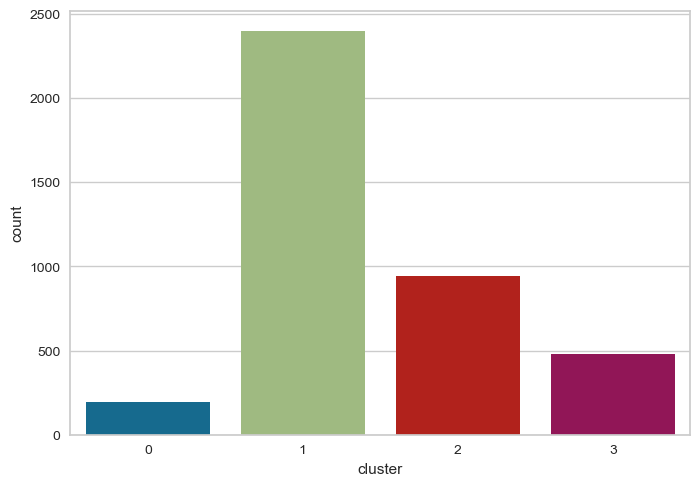

In [51]:
sns.countplot(x=df_merge["cluster"]);

In [52]:
silhouette_score(df_merge, prediction)

0.6081029629627702

In [53]:
wcss = [] #within cluster sum of squares
ss = []
for i in range(2, 11):
    model = KMeans(i)
    model = model.fit(df_merge)
    predictions = model.predict(df_merge)
    ss1 = silhouette_score(df_merge, predictions)
    ss.append(ss1)
    print(ss1)
    wcss.append(model.inertia_)

0.656939239998834
0.6229021871621668
0.6081029629627702
0.5450251920121549
0.5481176913310728
0.5389294719210623
0.53026096630254
0.5366504941562749
0.5070328019573399


Text(0, 0.5, 'WCSS')

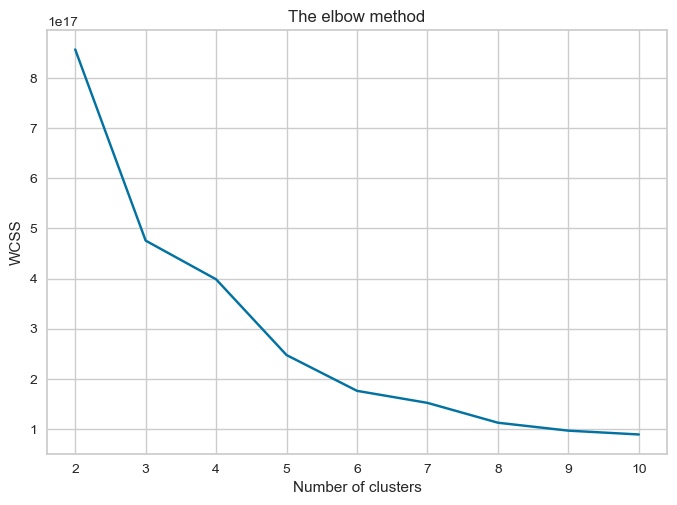

In [54]:
plt.plot(range(2, 11), wcss)
plt.title('The elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')

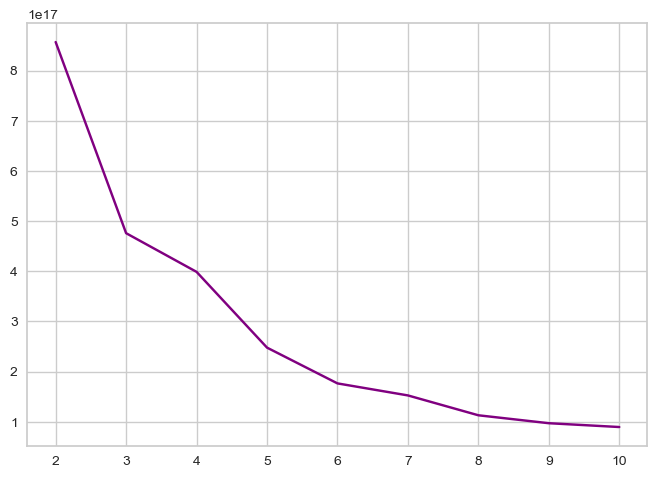

In [55]:
sns.lineplot(x=range(2, 11), y=wcss, markers="*", color="purple");

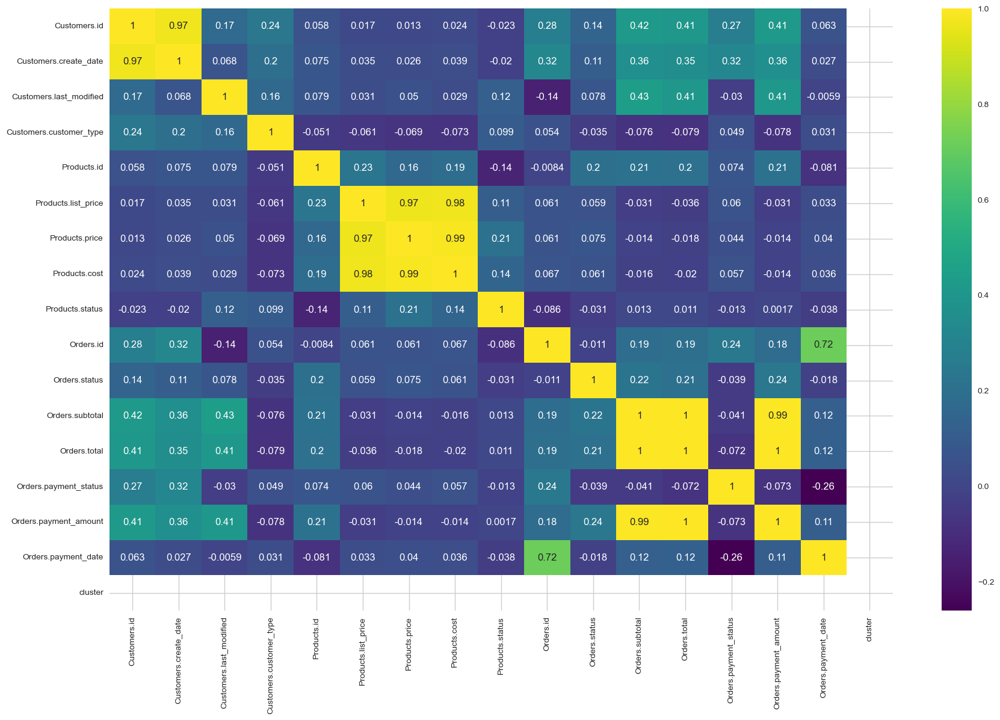

In [60]:
plt.figure(figsize=(21,13))
sns.heatmap(df_merge[df_merge.cluster==0].corr(numeric_only=True), annot=True, cmap="viridis");

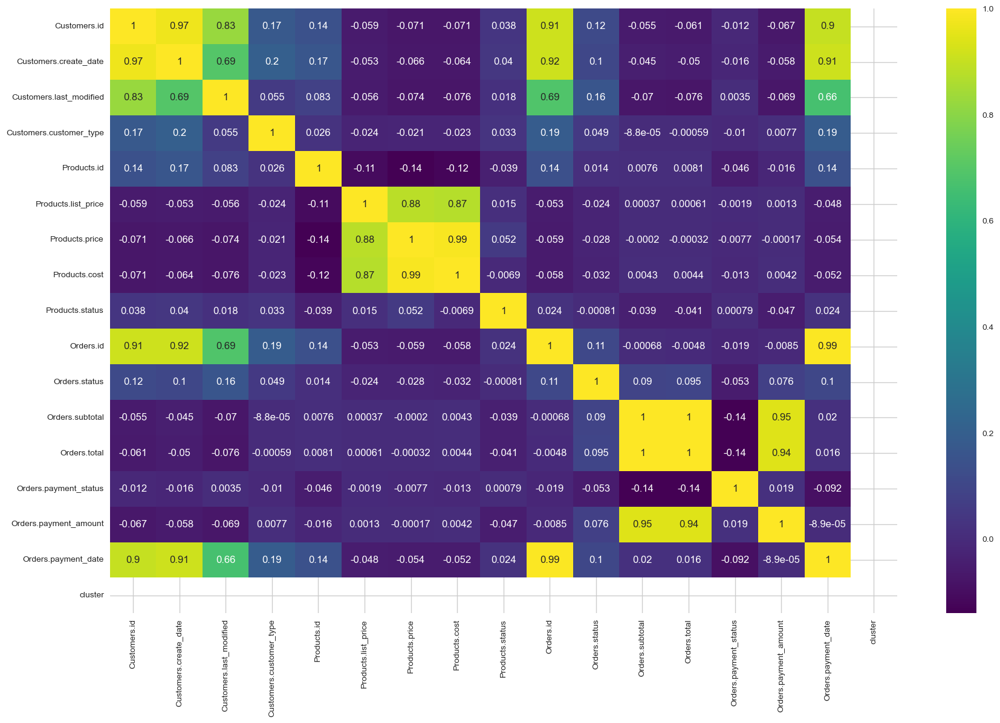

In [61]:
plt.figure(figsize=(21,13))
sns.heatmap(df_merge[df_merge.cluster==1].corr(numeric_only=True), annot=True, cmap="viridis");

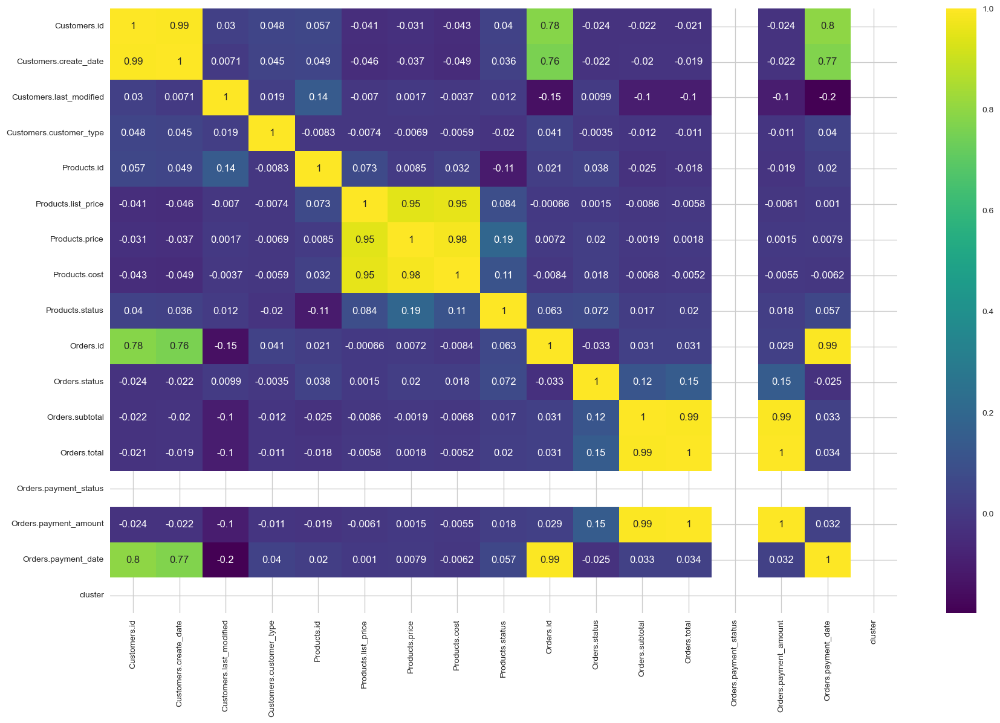

In [62]:
plt.figure(figsize=(21,13))
sns.heatmap(df_merge[df_merge.cluster==2].corr(numeric_only=True), annot=True, cmap="viridis");

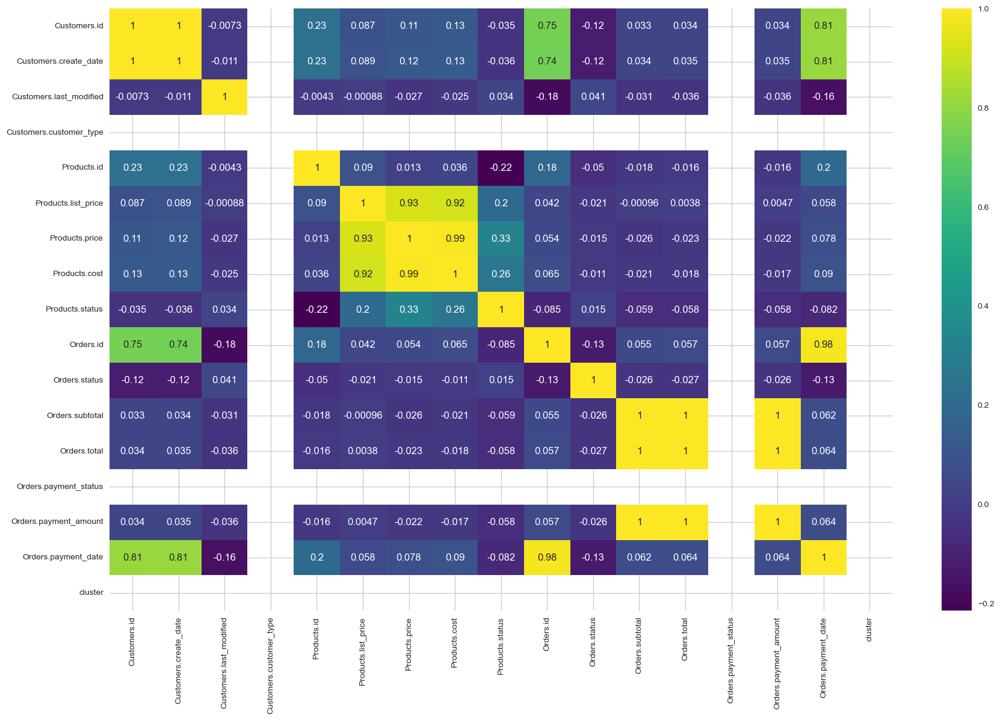

In [63]:
plt.figure(figsize=(21,13))
sns.heatmap(df_merge[df_merge.cluster==3].corr(numeric_only=True), annot=True, cmap="viridis");

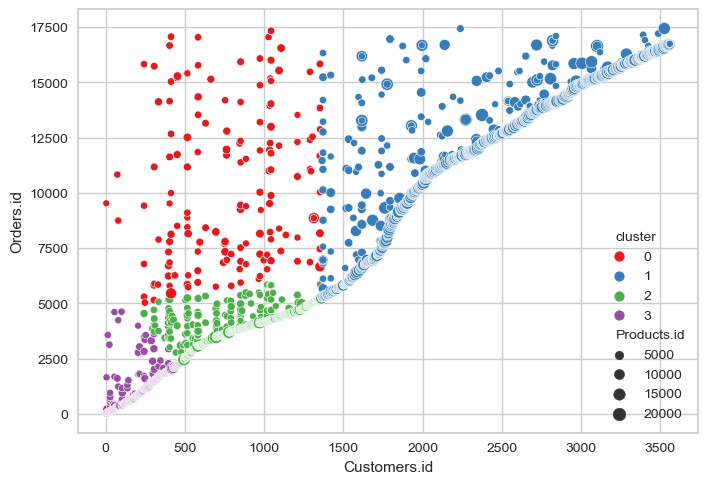

In [80]:
sns.scatterplot(x=df_merge['Customers.id'], y=df_merge['Orders.id'], size=df_merge["Products.id"], hue=df_merge['cluster'], palette='Set1');

## Hierarchical Clustering

In [81]:
from scipy.cluster.hierarchy import linkage,dendrogram

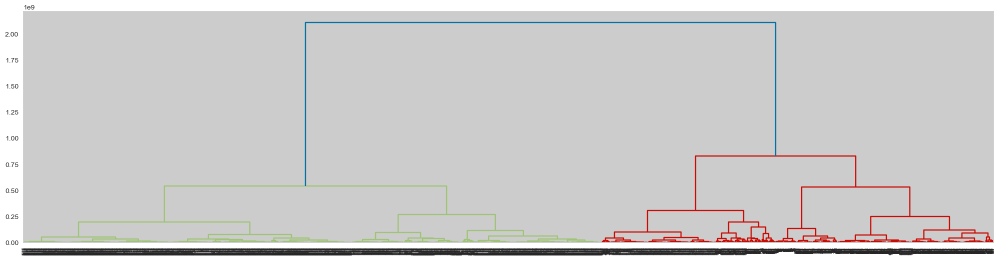

In [82]:
data = linkage(df_merge, method="ward", metric="euclidean")

plt.figure(figsize=(25, 6))
dendrogram(data);

## RFM --- Recency, Frequency and Money--- analysis

In [84]:
df_merge["Orders.payment_date"] = pd.to_datetime(df_merge["Orders.payment_date"], unit="s")

In [85]:
df_merge["Orders.payment_date"].head()

0   2015-03-10 20:24:59
1   2013-12-03 17:07:35
2   2015-12-08 19:40:52
3   2013-12-11 16:44:23
4   2013-12-12 15:19:59
Name: Orders.payment_date, dtype: datetime64[ns]

In [91]:
now = pd.to_datetime("2024-04-04")
recency = now - df_merge.groupby("Customers.id")["Orders.payment_date"].max()
recency = recency.dt.days

frequency = df_merge.groupby("Customers.id")["Orders.payment_date"].count()

monetary = df_merge.groupby("Customers.id")["Orders.total"].sum()

In [92]:
rfm = pd.DataFrame({
    "Recency": recency,
    "Frequency": frequency,
    "Monetary": monetary
    })
rfm

,Recency,Frequency,Monetary
Customers.id,,,
3,3039,2,108.720
4,3766,1,29.550
5,2897,3,124.990
7,3750,1,49.140
8,3733,1,69.700
...,...,...,...
3556,2889,1,56.930
3557,2889,1,32.490
3558,2889,1,19.950


In [93]:
rfm["cluster"] = df_merge["cluster"]
rfm

,Recency,Frequency,Monetary,cluster
Customers.id,,,,
3,3039,2,108.720,3
4,3766,1,29.550,3
5,2897,3,124.990,0
7,3750,1,49.140,3
8,3733,1,69.700,3
...,...,...,...,...
3556,2889,1,56.930,1
3557,2889,1,32.490,1
3558,2889,1,19.950,1


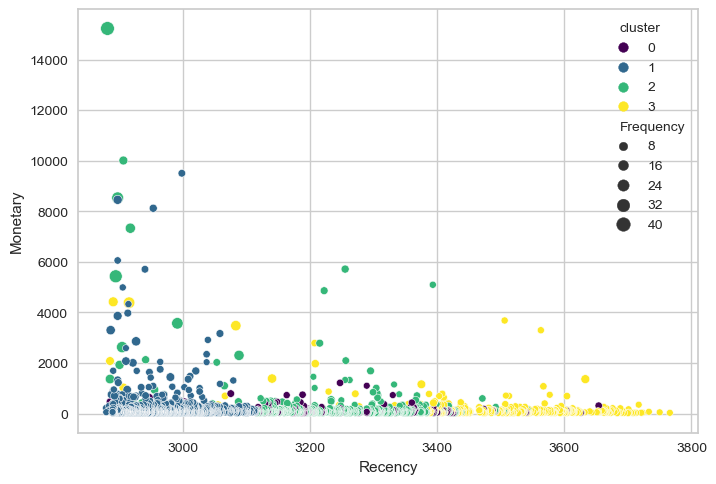

In [96]:
sns.scatterplot(x=rfm['Recency'], y=rfm['Monetary'], size=rfm["Frequency"], hue=rfm['cluster'], palette='viridis');